In [1]:
BATCH_SIZE = 1024

PAD_SIZE = 80
TARGET_LABELS = [
    "Improvement",
    "Solved",
    #"AreaRatio",
    "Stacks"
]

SEED = 3093453

# Preprocessing

## Load Packages and Data

In [2]:
import os
import sys

import numpy as np
import pandas as pd
import polars as pl

import tensorflow as tf

import matplotlib.pyplot as plt
import seaborn as sns

# Random Seeds
np.random.seed(SEED)
tf.random.set_seed(SEED)



# Cosmetics
np.set_printoptions(
    edgeitems=30,
    linewidth=100_000,
    suppress=True
    )

sns.set(
    context="talk",
    style="darkgrid"
)


cwd = os.getcwd()
cwd, _ = os.path.split(cwd)

In [3]:
import tensorflow as tf
from tensorflow import keras

train_samples = os.path.join(cwd, "data", "test") # 116586 + 489623 = 606209

#class_names = ["improved_solved", "improved", "solved", "fully_packed", "nothing_changed", "large"]

example_dataset = keras.preprocessing.text_dataset_from_directory(
    directory = train_samples,
    #labels = "inferred",
    #class_names=class_names,
    #label_mode="categorical",
    batch_size = BATCH_SIZE,
    max_length = None,
    shuffle = True,
    seed = SEED,
)

#class_names = np.array(class_names)

Found 104591 files belonging to 1 classes.


2024-02-23 00:21:18.356233: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M1 Pro
2024-02-23 00:21:18.356264: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2024-02-23 00:21:18.356267: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.33 GB
2024-02-23 00:21:18.356313: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-02-23 00:21:18.356335: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [4]:
for X, Y in example_dataset.take(1):
    pass

df = pl.DataFrame({
    "raw": X.numpy().astype(str),
    #"label": Y.numpy().astype(str)
})
print(df[0, 0])

dataset: X
instance: SA5
+-----------+
2D Packing MIP with Time Limit 16.76384625040794 [s] in Truck P193156207
Stack 0 with items: ['0090017100_14062023028254']
Stack 1 with items: ['0090017100_14062023028254']
Stack 2 with items: ['0090017100_14062023028254']
Stack 3 with items: ['0090017100_14062023020209']
Stack 4 with items: ['0090017100_14062023020209']
Stack 5 with items: ['0090017100_14062023007872']
Stack 6 with items: ['0090017100_14062023007872']
Stack 7 with items: ['0090017100_14062023001020']
Stack 8 with items: ['0090017100_14062023001020']
Stack 9 with items: ['0090017100_14062023001020']
Stack 10 with items: ['0090017100_14062023001020']
Stack 11 with items: ['0090017100_14062023000412']
Stack 12 with items: ['0090017100_14062023006598', '0090017100_14062023006598']
Stack 13 with items: ['0090017100_14062023006598', '0090017100_14062023006598']
Stack 14 with items: ['0090017100_14062023006598', '0090017100_14062023006598']
Stack 15 with items: ['0090017100_140620230065

In [5]:
#y_cat = class_names[np.argmax(Y, axis=1)]
#y_cat

## Loading CSVs

In [6]:
folder = "truck-item-infos"
file = "items.csv"

item_path = os.path.join(cwd, folder, file)
items = pl.read_csv(source = item_path);

items = items.lazy().with_columns([
    (pl.col("Item ident").alias("item_id")),
    (pl.col("Length") / 1000), # mm to m
    (pl.col("Width") / 1000),  # mm to m
    (pl.col("Height") / 1000), # mm to m
    (pl.col("Nesting height") / 1000), # mm to m
    (pl.col("Weight") / 1000), # kg to tons
    (pl.col("Forced orientation") == "lengthwise").alias("ForcedLength"),
    (pl.col("Forced orientation") == "widthwise").alias("ForcedWidth"),
    ((pl.col("Height") - pl.col("Nesting height")) / 1000).alias("NestedHeight"),
    pl.col("dataset").str.extract("([A-Z])")
]).drop([
    "Forced orientation", "Max stackability", "Inventory cost",
    "Earliest arrival time", "Latest arrival time", "Number of items",
    "instance_id",
    "Stackability code",
    "Item ident", # drop because of rename earlier
    # Unnecassary columns
    "Product code",
    "Package",
    "Plant code",
    "Product code",
    "Package code",
    "NestedHeight"
]).unique()

items.collect()

Supplier code,Supplier dock,Plant dock,Length,Width,Height,Weight,Nesting height,dataset,instance,item_id,ForcedLength,ForcedWidth
i64,str,str,f64,f64,f64,f64,f64,str,str,str,bool,bool
2671602,null,"""169GD-60""",1.6,1.2,0.93,0.38658,0.045,"""C""","""BY""","""0090016900_270…",false,false
7908418,null,"""169GB-30""",1.2,1.0,0.93,0.241835,0.045,"""C""","""BY""","""0090016900_270…",false,false
90016100,"""K11""","""GRD1""",2.3,1.6,1.0,1.57,0.045,"""C""","""BY""","""0090016900_270…",false,false
23676300,null,"""169GD-60""",2.4,2.2,1.52,0.5944,0.045,"""C""","""BY""","""0090016900_270…",false,false
90016100,"""K11""","""GRD1""",2.3,1.6,1.0,1.57,0.045,"""C""","""BY""","""0090016900_270…",false,false
239401,null,"""169GD-50""",1.206,1.01,0.384,0.122,0.0,"""C""","""BY""","""0090016900_270…",false,false
28681300,null,"""169GD-60""",1.2,1.0,0.975,0.276804,0.045,"""C""","""BY""","""0090016900_270…",false,false
90016100,"""K11""","""GRD1""",2.3,1.6,1.0,1.57,0.045,"""C""","""BY""","""0090016900_270…",false,false
22060301,null,"""169GB-30""",1.6,1.2,0.93,0.593925,0.045,"""C""","""BY""","""0090016900_270…",false,false


In [7]:
file = "trucks.csv"

truck_path = os.path.join(cwd, folder, file)

truck_clms = ["Id truck", "dataset", "instance",
              "Supplier code", "Supplier dock", "Plant dock",
              "Supplier loading order", "Supplier dock loading order", "Plant dock loading order",
             ]

truck_stops = (
    pl.read_csv(source = truck_path, columns = truck_clms)
    .lazy()
    .rename({"Id truck": "truck_id"})
    .sort(["dataset", "instance", "truck_id"])
    .with_columns([pl.col("dataset").str.extract("(\w)")])
    .unique()
)
truck_stops.collect()

Supplier code,Supplier loading order,Supplier dock,Supplier dock loading order,Plant dock,Plant dock loading order,truck_id,dataset,instance
i64,i64,str,i64,str,i64,str,str,str
29908700,1,null,1,"""X4""",1,"""P188730401""","""A""","""AS"""
29908700,1,null,1,"""X4""",1,"""P188730403""","""A""","""AS"""
62059600,1,null,1,"""X0""",1,"""P188731001""","""A""","""AS"""
62060800,1,null,1,"""X2""",1,"""P189731303""","""A""","""AS"""
29908700,1,null,1,"""X4""",1,"""P192730401""","""A""","""AS"""
29908700,1,null,1,"""X4""",1,"""P192730403""","""A""","""AS"""
29908700,1,null,1,"""X4""",1,"""P192730407""","""A""","""AS"""
25439300,1,null,1,"""X0""",1,"""P192731801""","""A""","""AS"""
62060800,1,null,1,"""X2""",1,"""P193731303""","""A""","""AS"""


In [8]:
file = "trucks.csv"

truck_path = os.path.join(cwd, folder, file)

truck_clms = ["Id truck", "dataset", "instance",
              "Length", "Width", "Max weight",
              "EMmm", "EMmr"
             ]

truck_dims = (
    pl.read_csv(source = truck_path, columns = truck_clms)
    .lazy()
    .rename({"Id truck": "truck_id", "Max weight": "Weight"})
    .sort(["dataset", "instance", "truck_id"])
    .with_columns([pl.col("dataset").str.extract("(\w)")])
    .unique()
)

truck_dims = truck_dims.with_columns([
    (pl.col("Length") / 1000),
    (pl.col("Width") / 1000),
    (pl.col("Weight") / 1000),
    (pl.col("EMmm") / 1000),
    (pl.col("EMmr") / 1000),
])

truck_dims.collect()

truck_id,Length,Width,Weight,EMmm,EMmr,dataset,instance
str,f64,f64,f64,f64,f64,str,str
"""P187730401""",14.94,2.5,24.0,12.0,31.5,"""A""","""AS"""
"""P188730401""",14.94,2.5,24.0,12.0,31.5,"""A""","""AS"""
"""P188730403""",14.94,2.5,24.0,12.0,31.5,"""A""","""AS"""
"""P188730503""",14.94,2.5,24.0,12.0,31.5,"""A""","""AS"""
"""P188731301""",14.94,2.5,24.0,12.0,31.5,"""A""","""AS"""
"""P189721701""",14.94,2.5,24.0,12.0,31.5,"""A""","""AS"""
"""P189721903""",14.94,2.5,24.0,12.0,31.5,"""A""","""AS"""
"""P189730403""",14.94,2.5,24.0,12.0,31.5,"""A""","""AS"""
"""P192708201""",14.94,2.5,24.0,12.0,31.5,"""A""","""AS"""


## Preprocessing Functions:

In [9]:
import sys
sys.path.append("..")

from utils.preprocessing import input_output_generation

In [10]:
cx, cy = input_output_generation(
    X,
    target_labels=TARGET_LABELS,
    pad_size=PAD_SIZE,
    shuffle=False,
    items=items,
    truck_stops=truck_stops,
    truck_dims=truck_dims,
)

In [11]:
cx[0][0, :40]

array([[ 1.605     ,  1.205     ,  0.317648  ,  0.        ,  0.        ,  1.        ,  0.        ,  0.83500004,  0.02999997],
       [ 1.605     ,  1.205     ,  0.317648  ,  0.        ,  0.        ,  1.        ,  0.        ,  0.83500004,  0.02999997],
       [ 1.605     ,  1.205     ,  0.317648  ,  0.        ,  0.        ,  1.        ,  0.        ,  0.83500004,  0.02999997],
       [ 1.605     ,  1.205     ,  0.310184  ,  0.        ,  0.        ,  1.        ,  0.        ,  0.83500004,  0.02999997],
       [ 1.605     ,  1.205     ,  0.310184  ,  0.        ,  0.        ,  1.        ,  0.        ,  0.83500004,  0.02999997],
       [ 1.605     ,  1.205     ,  0.352285  ,  0.        ,  0.        ,  1.        ,  0.        ,  0.83500004,  0.02999997],
       [ 1.605     ,  1.205     ,  0.352285  ,  0.        ,  0.        ,  1.        ,  1.        ,  0.83500004,  0.02999997],
       [ 1.605     ,  1.205     ,  0.33951   ,  0.        ,  0.        ,  1.        ,  0.        ,  0.83500004,  0.029

# DNN

In [12]:
loss_solved = tf.keras.losses.BinaryFocalCrossentropy(
    gamma=2,
    alpha = cy[0].mean(),
    name='solved_focal_loss'
)

loss_improvement = tf.keras.losses.BinaryFocalCrossentropy(
    gamma=1.5,
    alpha = cy[1].mean(),
    name='improvement_focal_loss'
)

loss_area_ratio = tf.keras.losses.BinaryCrossentropy(
    name='area_ratio_crossentropy'
)



loss_stacks = tf.keras.losses.BinaryFocalCrossentropy(
    gamma=6,
    alpha = cy[-1].mean(),
    name='stacks_focal_loss'
)

for i, target in enumerate(TARGET_LABELS):
    print(f"{target} Prevalence: {cy[i].mean():.1%}")

Improvement Prevalence: 45.2%
Solved Prevalence: 37.9%
Stacks Prevalence: 1.6%


In [13]:
target_loss_objects = {
    "Solved": loss_solved,
    "Improvement": loss_improvement,
    "AreaRatio": loss_area_ratio,
    "Stacks": loss_stacks,
}

loss_objects = [target_loss_objects[target] for target in TARGET_LABELS]
mean_losses = [tf.keras.metrics.Mean(name=target) for target in TARGET_LABELS]

In [14]:
all_target_metrics: list[list[tf.keras.metrics]] = {
    "Solved": [
        tf.keras.metrics.Precision(name = "PRC"),
        tf.keras.metrics.Recall(name = "SNS"),
        tf.keras.metrics.AUC(curve='PR', name="AUC"),
        tf.keras.metrics.BinaryAccuracy(name = "ACC")
    ],
    "Improvement": [
        tf.keras.metrics.Precision(name = "PRC"),
        tf.keras.metrics.Recall(name = "SNS"),
        tf.keras.metrics.AUC(curve='PR', name="AUC"),
        tf.keras.metrics.BinaryAccuracy(name = "ACC")
    ],
    "AreaRatio": [
        keras.metrics.RootMeanSquaredError(name="RMSE"),
        keras.metrics.MeanAbsoluteError(name="MAE")
    ],
    "Stacks": [
        tf.keras.metrics.Precision(name = "PRC"),
        tf.keras.metrics.Recall(name = "SNS"),
        tf.keras.metrics.AUC(curve='PR', name="AUC"),
        tf.keras.metrics.BinaryAccuracy(name = "ACC")
    ],
}

all_metrics = [all_target_metrics[target] for target in TARGET_LABELS]

In [15]:
from keras import backend as K
#model_path = os.path.join(cwd, "models", "FinalModelTraining-Train+Val-11.tf")
model_path = os.path.join(cwd, "models", "FinalModelTraining-Train+Val-21.tf")
model = tf.keras.models.load_model(model_path)
model

In [16]:
N_FEATURES = cx[0].shape[-1]

n_blocks=6
num_heads=4

# Learning Rate
initial_lr = 10e-3 # 10e-3
lr_decay = 0.9995

# Optimizer
optimizer = tf.keras.optimizers.legacy.Adam(learning_rate = initial_lr)

### Model Architecture Inspection:

In [17]:
_ = model(cx) # just check if it works
model.summary()

2024-02-23 00:21:37.842011: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 StackLevelInputFeatures (I  [(None, 80, 9)]              0         []                            
 nputLayer)                                                                                       
                                                                                                  
 MaskingLayer (Masking)      (None, 80, 9)                0         ['StackLevelInputFeatures[0][0
                                                                    ]']                           
                                                                                                  
 transformer_encoder (Trans  ((None, 80, 9),              613       ['MaskingLayer[0][0]']        
 formerEncoder)               (None, 4, 80, 80))                                              

## Helper Functions

In [18]:
def print_status_bar(iteration, total, losses, all_metrics=None, training:bool=True):
    tabs = "\t\t\t\t\t\t\t\t\t\t\t\t\t\t"
    metrics = tabs.join([
        f"{TARGET_LABELS[i]:<12}\tLoss: {losses[i].result():.4f}" +
        "\t".join([
            f"{m.name:>10}: {m.result():.2%}"
            if m.name not in ["MAE", "RMSE"]
            else f"{m.name:>10}: {m.result():.4f}"
            for m in metrics
        ])
        for i, metrics in enumerate(all_metrics)
    ])
    
    if training:
        prefix="Training"
    else:
        prefix="Validation"
    
    print(f"\r{prefix}-Iteration: {iteration+1:0>3}/{total:<3}\tLR: {float(optimizer.lr):<1000.9f}" + metrics,
          end="")


In [19]:
@tf.function
def model_pass(model, inputs, targets, training):
    """
    Usual Tensorflow model passing of inputs throught the network.
    If in training mode, the optimizier can apply the gradients
    observed with GradientTape to the model parameters
    """
    
    with tf.GradientTape() as tape:
        
        outputs = model(inputs, training=training)

        # Single output is not a list!
        if type(outputs) != list:
            outputs = [outputs]
            
        losses = [l(t, o) for l,o,t in zip(loss_objects, outputs, targets)]
        
        if training:
            gradients = tape.gradient(losses, model.trainable_variables)
            optimizer.apply_gradients(zip(gradients, model.trainable_variables))
            
        for i, mean_loss in enumerate(mean_losses):
            if len(mean_losses) <= 1:
                mean_loss(losses)
            else:
                mean_loss(losses[i])
        
    return outputs


In [20]:
def run_epoch(model, dataset, target_labels, all_metrics:list[list[tf.keras.metrics]],
              epoch:int, history:pd.DataFrame, training:bool=True,
              shuffle:bool=True):
    """
    Single epoch, running several training steps over a dataset
    """

    for step, X_batch in enumerate(dataset):
        
        X_batch, y_batch = input_output_generation(
            X_batch,
            items=items,
            truck_stops=truck_stops,
            truck_dims=truck_dims,
            target_labels=target_labels,
            shuffle=shuffle,
            pad_size=PAD_SIZE
        )
        
        outputs = model_pass(model, X_batch, y_batch, training=training)
        
        for i, metrics in enumerate(all_metrics):
            for metric in metrics:
                metric(y_batch[i].reshape(-1), outputs[i].numpy().reshape(-1))
    
        print_status_bar(step, len(dataset), mean_losses, all_metrics, training=training)
    
        #### LEARNING RATE UPDATE ####
        if training:
            optimizer.lr = geometric_decay((epoch-1)*len(dataset)+step, initial_lr, lr_decay)
    
    print("\n")

    #### UPDATE METRICS
    for i, metrics in enumerate(all_metrics):
        for metric in metrics:
            data = pd.DataFrame({
                "Epoch": [epoch],
                "Target": [target_labels[i]],
                "Metric": [metric.name if training else f"Val-"+metric.name],
                "Value": [float(metric.result())],
            })
            history = pd.concat([history, data])
            metric.reset_states()

    for i, mean_loss in enumerate(mean_losses):
        data = pd.DataFrame({
            "Epoch": [epoch],
            "Target": [target_labels[i]],
            "Metric": ["Loss" if training else f"Val-"+"Loss"],
            "Value": [float(mean_loss.result())],
        })
        history = pd.concat([history, data])
        mean_loss.reset_states()
            
    return model, history

# Test Set Performance

# Compare the relationship between solved and inproved instances

In [21]:
for X_val_raw, y in example_dataset:
    X_val, y_val = input_output_generation(
            X_val_raw,
            items=items,
            truck_stops=truck_stops,
            truck_dims=truck_dims,
            target_labels=TARGET_LABELS,
            shuffle=False,
            pad_size=PAD_SIZE
        )
    break

X_val_raw = X_val_raw.numpy().astype(str)
print(X_val_raw[0])

dataset: X
instance: AS4
+-----------+
2D Packing MIP with Time Limit 30 [s] in Truck P216770405
Stack 0 with items: ['0090018000_14062023011329', '0090018000_14062023011329', '0090018000_14062023011329']
Stack 1 with items: ['0090018000_14062023011329', '0090018000_14062023011167', '0090018000_14062023011167']
Stack 2 with items: ['0090018000_14062023011167', '0090018000_14062023011167', '0090018000_14062023011167']
Stack 3 with items: ['0090018000_14062023010402', '0090018000_14062023010402', '0090018000_14062023010402']
Stack 4 with items: ['0090018000_14062023010402', '0090018000_14062023010402', '0090018000_14062023010402']
Stack 5 with items: ['0090018000_14062023010402', '0090018000_14062023010402', '0090018000_14062023010402']
Stack 6 with items: ['0090018000_14062023010402', '0090018000_14062023010402', '0090018000_14062023010402']
Stack 7 with items: ['0090018000_14062023010402', '0090018000_14062023010402', '0090018000_14062023010402']
Stack 8 with items: ['0090018000_140620

In [22]:
X_val[0][0,:25]

array([[1.2      , 1.       , 0.406278 , 0.       , 0.       , 2.       , 0.       , 0.0999999, 0.5      ],
       [1.2      , 1.       , 0.390626 , 0.       , 0.       , 2.       , 0.       , 0.0999999, 0.5      ],
       [1.2      , 1.       , 0.3828   , 0.       , 0.       , 2.       , 0.       , 0.0999999, 0.5      ],
       [1.2      , 1.       , 0.426732 , 0.       , 0.       , 2.       , 0.       , 0.0999999, 0.5      ],
       [1.2      , 1.       , 0.426732 , 0.       , 0.       , 2.       , 0.       , 0.0999999, 0.5      ],
       [1.2      , 1.       , 0.426732 , 0.       , 0.       , 2.       , 0.       , 0.0999999, 0.5      ],
       [1.2      , 1.       , 0.426732 , 0.       , 0.       , 2.       , 0.       , 0.0999999, 0.5      ],
       [1.2      , 1.       , 0.426732 , 0.       , 0.       , 2.       , 0.       , 0.0999999, 0.5      ],
       [1.2      , 1.       , 0.426732 , 0.       , 0.       , 2.       , 0.       , 0.0999999, 0.5      ],
       [1.2      , 1.       

## Model prediction Quality:

In [23]:
y_pred_improvement, y_pred_solved = model(X_val)
y_pred_improvement, y_pred_solved = y_pred_improvement.numpy(), y_pred_solved.numpy()

In [50]:
confidently_correct_index = (y_val[0]).astype(bool) & (y_pred_improvement>0.95) & (y_pred_solved >  0.95)

X_val_raw[confidently_correct_index]
X_val[0][confidently_correct_index]

array([[[ 2.3       ,  1.6       ,  3.1436    ,  0.        ,  0.        ,  1.        ,  1.        ,  0.1400001 ,  0.84000003],
        [ 2.3       ,  1.6       ,  3.14      ,  0.        ,  0.        ,  1.        ,  0.        ,  0.1400001 ,  0.84000003],
        [ 2.3       ,  1.6       ,  3.14      ,  0.        ,  0.        ,  1.        ,  0.        ,  0.1400001 ,  0.84000003],
        [ 2.3       ,  1.6       ,  3.14      ,  0.        ,  0.        ,  1.        ,  0.        ,  0.1400001 ,  0.84000003],
        [ 2.3       ,  1.6       ,  3.14      ,  0.        ,  0.        ,  1.        ,  0.        ,  0.1400001 ,  0.84000003],
        [ 2.3       ,  1.6       ,  3.14      ,  0.        ,  0.        ,  1.        ,  0.        ,  0.1400001 ,  0.84000003],
        [ 2.3       ,  1.6       ,  3.14      ,  0.        ,  0.        ,  1.        ,  0.        ,  0.1400001 ,  0.84000003],
        [ 2.3       ,  1.6       ,  3.14      ,  0.        ,  0.        ,  1.        ,  1.        ,  0.1400001 

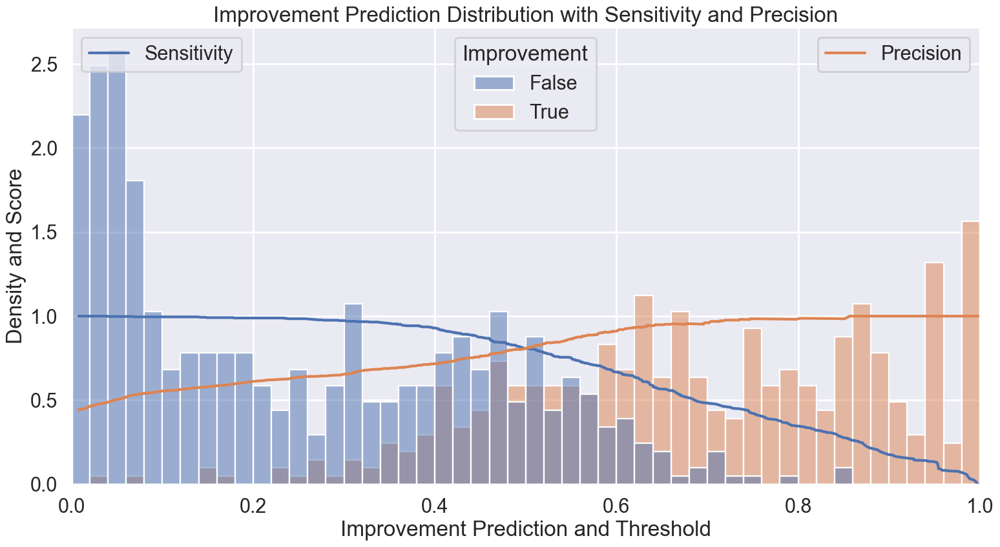

In [44]:
from sklearn.metrics import precision_recall_curve

sns.set(context="poster")

pred_df = pd.DataFrame([y_pred_improvement, y_val[0].astype(bool)]).T
pred_df.columns = ["Prediction", "Improvement"]

prec, sens, thrsh = precision_recall_curve(y_val[0], y_pred_improvement, drop_intermediate=False, pos_label=True)
thrsh = np.append(thrsh, 1)

fig, ax = plt.subplots(figsize=(16, 9))



g = sns.histplot(
    data=pred_df,
    x="Prediction",
    hue="Improvement",
    bins=np.arange(0, 1.02, 0.02),
    stat="density",
    ax=ax,
);
sns.move_legend(g, "upper center")
legend=ax.get_legend()


sens_curve = ax.plot(thrsh, sens, label="Sensitivity");
prec_curve = ax.plot(thrsh, prec, label="Precision");
#ax.legend();

ax.set(
    title="Improvement Prediction Distribution with Sensitivity and Precision",
    xlabel="Improvement Prediction and Threshold",
    ylabel="Density and Score",
    xlim=[0, 1],
);

#hist_legend = ax.legend(handles=hist, loc='upper right');
sens_legend = ax.legend(handles=sens_curve, loc='upper left')
prec_legend = ax.legend(handles=prec_curve, loc='upper right')

ax.add_artist(sens_legend)
ax.add_artist(prec_legend)
ax.add_artist(legend);

plt.tight_layout()
#for file_format in ["png", "jpg", "pdf", "svg"]:
#    path = os.path.join(cwd, "plots", "2024-01-13-Model-Inference", f"ImprovementPredictionDistribution-Train+Val.{file_format}")
#    plt.savefig(path)


#first_legend = ax.legend(handles=[line1], loc='upper right')

In [45]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score


def specificity(y_true, y_pred):
    return recall_score(y_true, y_pred, pos_label=0)

for threshold in np.arange(0, 1, 0.1):
    y_pred_improvement_bool = (y_pred_improvement > threshold)
    print(f"Threshold: {threshold:.1f}", end = "\t\t")
    for metric in [specificity, recall_score, precision_score, f1_score, accuracy_score]:
        print(f"{metric.__name__.split('_')[0]}: {metric(y_val[0], y_pred_improvement_bool):.1%}", end="\t\t")
    print()

Threshold: 0.0		specificity: 0.0%		recall: 100.0%		precision: 44.3%		f1: 61.4%		accuracy: 44.3%		
Threshold: 0.1		specificity: 36.3%		recall: 99.6%		precision: 55.5%		f1: 71.2%		accuracy: 64.4%		
Threshold: 0.2		specificity: 50.0%		recall: 98.9%		precision: 61.2%		f1: 75.6%		accuracy: 71.7%		
Threshold: 0.3		specificity: 59.3%		recall: 97.4%		precision: 65.6%		f1: 78.4%		accuracy: 76.2%		
Threshold: 0.4		specificity: 70.9%		recall: 93.0%		precision: 71.8%		f1: 81.0%		accuracy: 80.7%		
Threshold: 0.5		specificity: 84.7%		recall: 80.8%		precision: 80.8%		f1: 80.8%		accuracy: 83.0%		
Threshold: 0.6		specificity: 94.9%		recall: 66.7%		precision: 91.3%		f1: 77.1%		accuracy: 82.4%		
Threshold: 0.7		specificity: 98.4%		recall: 48.2%		precision: 96.1%		f1: 64.2%		accuracy: 76.2%		
Threshold: 0.8		specificity: 99.6%		recall: 34.6%		precision: 98.7%		f1: 51.2%		accuracy: 70.8%		
Threshold: 0.9		specificity: 100.0%		recall: 17.6%		precision: 100.0%		f1: 30.0%		accuracy: 63.5%		


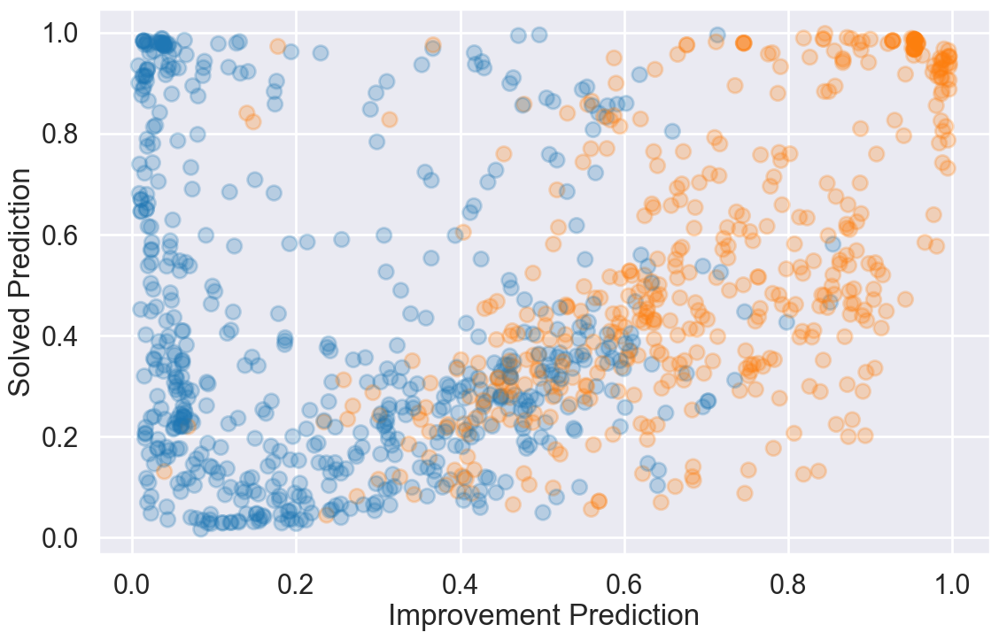

In [46]:
plt.figure(figsize=(13, 8))
plt.scatter(
    y_pred_improvement,
    y_pred_solved,
    c=["tab:orange" if y_improvement else "tab:blue" for y_improvement in y_val[0]],
    alpha = 0.25);
plt.ylabel("Solved Prediction")
plt.xlabel("Improvement Prediction");

# Visualize Attention Matrix:

In [68]:
from utils.DNN.utils import get_attention_scores

attention = get_attention_scores(model, model_inputs=X_val, layer_name=f"transformer_encoder_5")
attention.shape

(1024, 4, 80, 80)

In [ ]:
example_index = 2
n_inputs = np.argmax(np.all(X_val[0][example_index].round(2) == 0, axis=1))


num_layers = 6
num_heads = 4

fig, ax = plt.subplots(num_layers, num_heads, figsize=(16, num_layers*5))

for encoder_layer in range(num_layers):
    
    encoder_layer_name = f"transformer_encoder_{encoder_layer}" if encoder_layer else f"transformer_encoder"
    attention = get_attention_scores(model, model_inputs=X_val, layer_name=encoder_layer_name)
    
    for head in range(num_heads):
        attention_matrix = attention[example_index, head, :n_inputs, :n_inputs]
        sns.heatmap(
            attention_matrix.T,
            square=True,
            cbar=False,
            vmin=0,
            #vmax=0.1,
            ax=ax[encoder_layer, head],
            yticklabels=[]
        );

        
    
    ax[encoder_layer, 0].set(
        ylabel=f"Encoder Layer {encoder_layer+1}"
    )
for head in range(num_heads):
    ax[0, head].set(
        title=f"Attention Head {head+1}"
    )

fig.suptitle("Truncated Encoder Attention Heads")

plt.tight_layout()
for file_format in ["png", "jpg", "pdf", "svg"]:
    path = os.path.join(cwd, "plots", "2024-01-13-Model-Inference", f"AttentionExample-Train+Val.{file_format}")
    plt.savefig(path)


In [ ]:
print(X_val_raw[example_index])

In [ ]:
X_val[0][example_index,:50]

# Plot inputs

In [ ]:
X = cx[0]

In [61]:


from matplotlib.patches import Rectangle, Patch
from matplotlib.collections import PatchCollection
from matplotlib.lines import Line2D

def plot_truck(x, ax, print_x:bool=True):
    box_colors = {
        1: "tab:blue",
        2: "tab:orange",
        3: "tab:green",
        4: "tab:purple",
        5: "tab:cyan",
    }


    # truncate zero rows
    item_count = np.argmax(np.all(x==0, axis=1))
    x = x[:item_count]
    # sort by stop index and width
    stop_order = np.argsort(x[:,5]*10000+x[:,1])
    x = x[stop_order,:]
    
    if print_x:
        print(x.shape)
        print(x)
    
    
    item_lengths = x[1:, 0]
    item_widths = x[1:, 1]
    item_weights = x[1:, 2]
    item_forced_length = x[1:, 3]
    item_forced_width = x[1:, 4]
    item_stop_index = x[1:, 5]
    item_in_solution = x[1:, 6]



    cum_item_lengths = np.cumsum([0, *item_lengths])#-item_lengths[0]
    cum_item_widths = np.cumsum(item_widths)-item_widths[0]
    
    truck_length = x[0, 0]
    truck_width  = x[0, 1]
    truck_weight = x[0, 2]




    odd_lengths = item_lengths[0::2]
    even_lengths = item_lengths[1::2]
    if len(odd_lengths) > len(even_lengths):
        even_lengths = np.append(even_lengths, 0)
    
    box_offsets = np.maximum(odd_lengths, even_lengths)
    box_offsets = np.cumsum([0, *box_offsets])#-box_offsets[0]
    #print(box_offsets)


    
    for item_idx in range(len(item_lengths)):
        #ls = "-" if item_in_solution[item_idx] else "--"
        lw = item_weights[item_idx] * 4
        fc=box_colors[item_stop_index[item_idx]]#;print(item_idx, fc)
        item = Rectangle(
            xy=(
                box_offsets[item_idx//2-1],
                #np.cumsum(item_widths-item_widths[0])[item_idx]
                item_widths[item_idx-1] if (item_idx%2) else 0
                #cum_item_widths[item_idx]
               ),
            width =item_lengths[item_idx],
            height = item_widths[item_idx],
            #linewidth=3,
            linewidth=lw,
            edgecolor='k',
            #linestyle= ls[item_idx],
            #linestyle= "-" if not item_in_solution[item_idx] else "--",
            #facecolor='none'
            facecolor=fc
        );
        ax.add_patch(item);
    
        if item_in_solution[item_idx]:
            # BOTTOM LEFT TO TOP RIGHT
            ax.plot(
                [
                    #cum_item_lengths[item_idx//2],
                    box_offsets[item_idx//2],
                    #cum_item_lengths[item_idx//2]+item_lengths[item_idx]
                    box_offsets[item_idx//2]+item_lengths[item_idx]
                ],
                [
                    cum_item_widths[item_idx%2],
                    cum_item_widths[item_idx%2]+item_widths[item_idx],
                ],
                c="k",
                lw=lw,
            )
            # TOP LEFT TO BOTTOM RIGHT
            ax.plot(
                [
                    cum_item_lengths[item_idx//2],
                    cum_item_lengths[item_idx//2]+item_lengths[item_idx]
                ],
                [
                    cum_item_widths[item_idx%2]+item_widths[item_idx],
                    cum_item_widths[item_idx%2],
                ],
                c="k",
                lw=lw,
            )

        
    ######
    
    truck = Rectangle(
        xy=(0, 0),
        width =truck_length,
        height = truck_width,
        linewidth=5,
        edgecolor='r',
        facecolor='none'
        
    )
    ax.add_patch(truck);
    
    
    # LEGEND
    legend_elements = [
        Patch(facecolor=color, edgecolor='k', label=f'Stop Index {index}')
        for index, color in box_colors.items()
    ]
    legend_elements+=[Line2D([], [], color='k', marker='x',
                             linestyle='None', #linewidth=100,
                             markersize=20,label='Excluded Stacks')]
    legend_elements+=[Patch(facecolor="none", edgecolor='k', label=f'Stack Weight', linewidth=3,)]
    legend_elements+=[Patch(facecolor="none", edgecolor='r', label=f'Truck', linewidth=5,)]
    ax.legend(
        handles=legend_elements,
        #loc='upper left',
        loc='upper right',
    );
    

    # PLOT DIMENSIONS
    ax.set(
        xlim=[-0.2, 20],
        ylim=[-0.05, 3],
        xlabel="Truck Length [m]",
        ylabel="Truck Width [m]",
    )
    ax.set_aspect('equal',
                  adjustable='box'
                 )
    #print(df[example_index, "raw"])
    #print(y_cat[example_index])

[[13.5         2.44       26.         12.         31.5         0.          0.          2.44        0.        ]
 [ 2.3         1.6         3.1436      0.          0.          1.          1.          0.1400001   0.84000003]
 [ 2.3         1.6         3.14        0.          0.          1.          0.          0.1400001   0.84000003]
 [ 2.3         1.6         3.14        0.          0.          1.          0.          0.1400001   0.84000003]
 [ 2.3         1.6         3.14        0.          0.          1.          0.          0.1400001   0.84000003]
 [ 2.3         1.6         3.14        0.          0.          1.          0.          0.1400001   0.84000003]
 [ 2.3         1.6         3.14        0.          0.          1.          0.          0.1400001   0.84000003]
 [ 2.3         1.6         3.14        0.          0.          1.          0.          0.1400001   0.84000003]
 [ 2.3         1.6         3.14        0.          0.          1.          1.          0.1400001   0.84000003]]


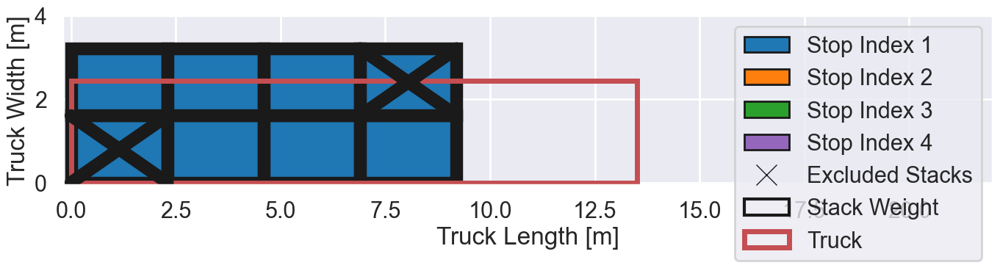

In [62]:
example_index = 15

#nonzero_indices, missing_stacks_solutions = np.nonzero(cy[-1])
#missing_stacks_solution = np.array([missing_stacks_solutions[i] for i in range(len(nonzero_indices)) if (nonzero_indices[i] == example_index)])

missing_stacks_solution = y_val[-1][example_index]

x = X_val[0][example_index]


box_colors = {
    1: "tab:blue",
    2: "tab:orange",
    3: "tab:green",
    4: "tab:purple"
}



item_count = np.argmax(np.all(x==0, axis=1))
x = x[:item_count]
stop_order = np.argsort(x[:,5]*100+x[:,1])
x = x[stop_order,:]
missing_stacks_solution = missing_stacks_solution[stop_order]
print(x)


item_lengths = x[1:, 0]
item_widths = x[1:, 1]
item_weights = x[1:, 2]
item_forced_length = x[1:, 3]
item_forced_width = x[1:, 4]
item_stop_index = x[1:, 5]
item_in_solution = x[1:, 6]


truck_length = x[0, 0]
truck_width = x[0, 1]
truck_weight = x[0, 2]



odd_lengths = item_lengths[0::2]
even_lengths = item_lengths[1::2]
if len(odd_lengths) > len(even_lengths):
    even_lengths = np.append(even_lengths, 0)

box_offsets = np.maximum(even_lengths, odd_lengths)
box_offsets = np.cumsum([0, *box_offsets])#-box_offsets[0]

fig, ax = plt.subplots(figsize=(20, 3))



for item_idx in range(len(item_lengths)):
    #ls = "-" if item_in_solution[item_idx] else "--"
    lw = item_weights[item_idx] * 4
    fc=box_colors[item_stop_index[item_idx]]#;print(item_idx, fc)
    item = Rectangle(
        xy=(
            box_offsets[item_idx//2],
            #np.cumsum(item_widths-item_widths[0])[item_idx]
            item_widths[item_idx-1] if (item_idx%2) else 0
            #cum_item_widths[item_idx]
           ),
        width =item_lengths[item_idx],
        height = item_widths[item_idx],
        linewidth=lw,
        edgecolor='k',
        facecolor=fc
    );
    ax.add_patch(item);


    if item_in_solution[item_idx]:
        # BOTTOM LEFT TO TOP RIGHT
        ax.plot(
            [
                box_offsets[item_idx//2],
                box_offsets[item_idx//2]+item_lengths[item_idx]
            ],
            [
                (item_widths[item_idx-1] if (item_idx%2) else 0),
                (item_widths[item_idx-1] if (item_idx%2) else 0)+item_widths[item_idx],
            ],
            c="k",
            lw=lw,
        )
        # TOP LEFT TO BOTTOM RIGHT
        ax.plot(
            [
                box_offsets[item_idx//2],
                box_offsets[item_idx//2]+item_lengths[item_idx]
            ],
            [
                (item_widths[item_idx-1] if (item_idx%2) else 0)+item_widths[item_idx],
                (item_widths[item_idx-1] if (item_idx%2) else 0),
            ],
            c="k",
            lw=lw,
        )

    if missing_stacks_solution[item_idx+1]:
        ax.plot(
            [
                box_offsets[item_idx//2],
                box_offsets[item_idx//2]+item_lengths[item_idx]
            ],
            [
                (item_widths[item_idx-1] if (item_idx%2) else 0),
                (item_widths[item_idx-1] if (item_idx%2) else 0)+item_widths[item_idx],
            ],
            c="r",
            lw=lw,
            ls="--"
        )
        # TOP LEFT TO BOTTOM RIGHT
        ax.plot(
            [
                box_offsets[item_idx//2],
                box_offsets[item_idx//2]+item_lengths[item_idx]
            ],
            [
                (item_widths[item_idx-1] if (item_idx%2) else 0)+item_widths[item_idx],
                (item_widths[item_idx-1] if (item_idx%2) else 0),
            ],
            c="r",
            lw=lw,
            ls="--"
        )








######

truck = Rectangle(
    xy=(0, 0),
    width =truck_length,
    height = truck_width,
    linewidth=5,
    edgecolor='r',
    facecolor='none'
    
)
ax.add_patch(truck);


# LEGEND
legend_elements = [
    Patch(facecolor=color, edgecolor='k', label=f'Stop Index {index}')
    for index, color in box_colors.items()
]
legend_elements+=[Line2D([], [], color='k', marker='x',
                         linestyle='None', #linewidth=100,
                         markersize=20,label='Excluded Stacks')]
legend_elements+=[Patch(facecolor="none", edgecolor='k', label=f'Stack Weight', linewidth=3,)]
legend_elements+=[Patch(facecolor="none", edgecolor='r', label=f'Truck', linewidth=5,)]
ax.legend(
    handles=legend_elements,
    #loc='upper left',
    loc='upper right',
);


# PLOT DIMENSIONS
ax.set(
    xlim=[-0.2, 22],
    ylim=[-0.05, 4],
    xlabel="Truck Length [m]",
    ylabel="Truck Width [m]",
)
ax.set_aspect(
    'equal',
    adjustable='box'
)
print(df[example_index, "raw"])
#print(y_cat[example_index])

/var/folders/j4/qmf6qmvd1gv0nctgx3m6jm3r0000gn/T/ipykernel_18909/3407399892.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(30, 8))


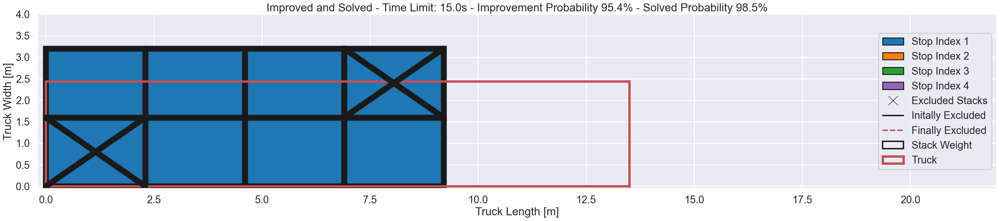

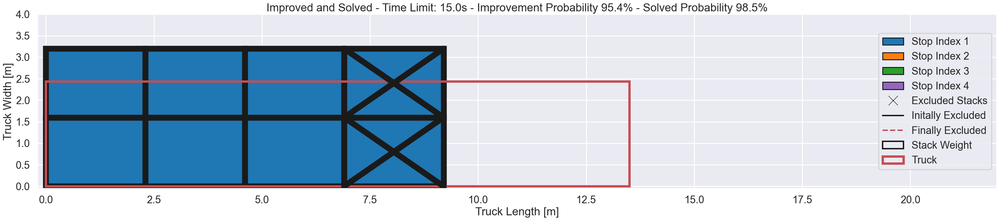

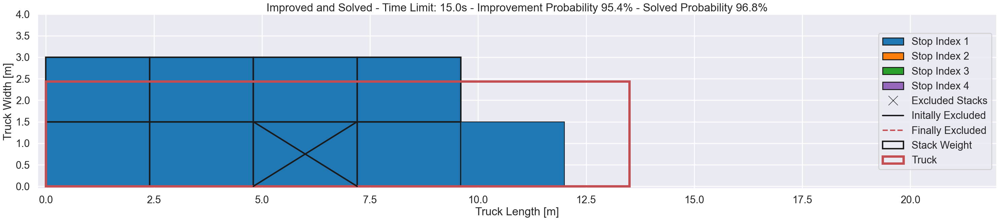

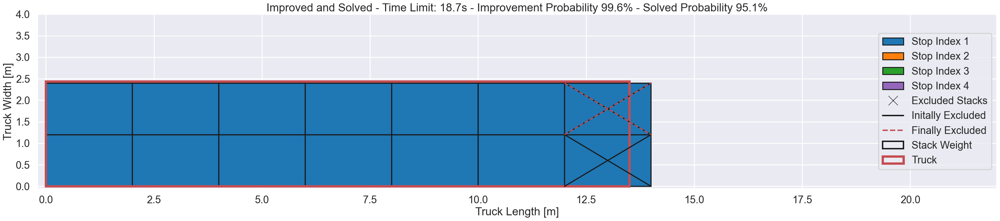

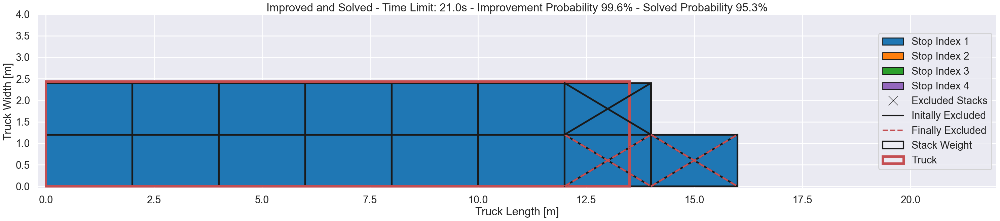

...

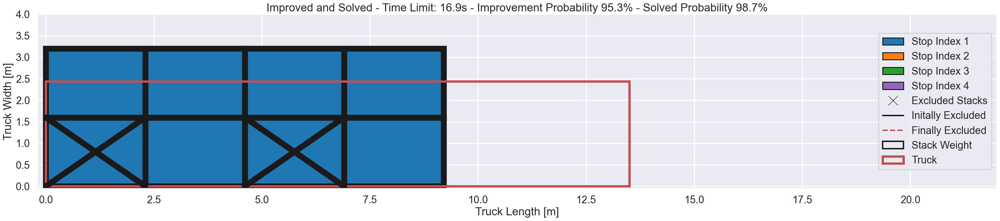

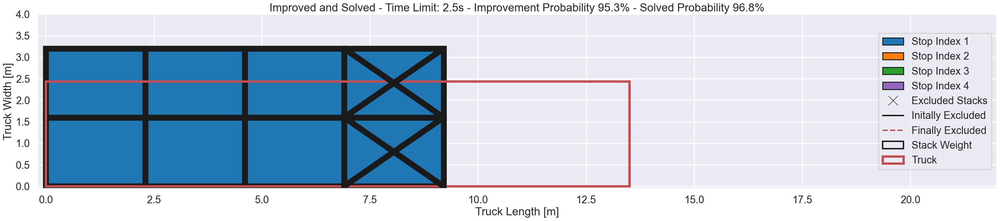

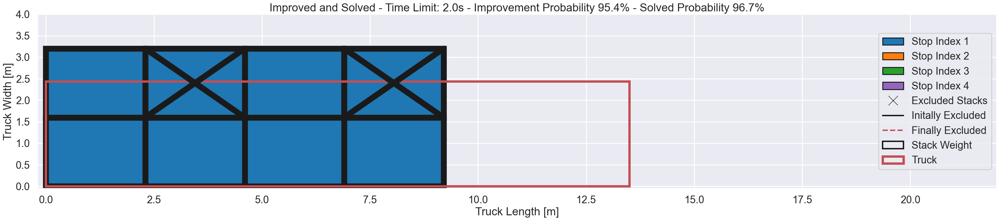

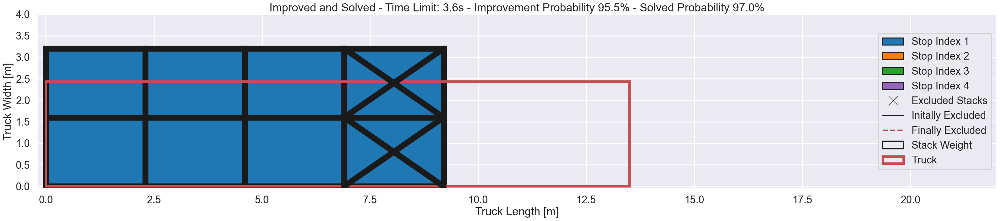

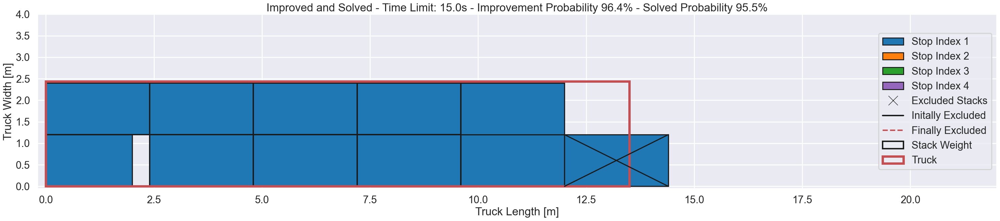

In [66]:
sns.set(context="poster")
time_limits = X_val[1]

for example_index in np.where(confidently_correct_index)[0]:
    #fig, ax = plt.subplots(figsize=(50, 5))
    fig, ax = plt.subplots(figsize=(30, 8))


    x = X_val[0][example_index]
    missing_stacks_solution = y_val[-1][example_index]
    
    
    box_colors = {
        1: "tab:blue",
        2: "tab:orange",
        3: "tab:green",
        4: "tab:purple"
    }
    label_title = {
        "fully_packed": "Example Truck fully packed",
        "nothing_changed": "Example Truck unchanged",
        #"neither": "Example Truck neither improved nor solved",
        "large": "Example Truck large",
        "solved": "Example Truck solved",
        "improved": "Example Truck improved",
        "improved_solved": "Example Truck both improved and solved",
    }
    
    
    
    item_count = np.argmax(np.all(x==0, axis=1))
    x = x[:item_count]
    stop_order = np.argsort(x[:,5]*100+x[:,1])
    x = x[stop_order,:]
    missing_stacks_solution = missing_stacks_solution[stop_order]
    #print(x)
    #print(df[example_index, "raw"])
    
    
    item_lengths = x[1:, 0]
    item_widths = x[1:, 1]
    item_weights = x[1:, 2]
    item_forced_length = x[1:, 3]
    item_forced_width = x[1:, 4]
    item_stop_index = x[1:, 5]
    item_in_solution = x[1:, 6]
    
    
    truck_length = x[0, 0]
    truck_width = x[0, 1]
    truck_weight = x[0, 2]
    
    
    
    odd_lengths = item_lengths[0::2]
    even_lengths = item_lengths[1::2]
    if len(odd_lengths) > len(even_lengths):
        even_lengths = np.append(even_lengths, 0)
    
    box_offsets = np.maximum(even_lengths, odd_lengths)
    box_offsets = np.cumsum([0, *box_offsets])#-box_offsets[0]
    
    
    
    for item_idx in range(len(item_lengths)):
        #ls = "-" if item_in_solution[item_idx] else "--"
        lw = item_weights[item_idx] * 4
        fc=box_colors[item_stop_index[item_idx]]#;print(item_idx, fc)
        item = Rectangle(
            xy=(
                box_offsets[item_idx//2],
                #np.cumsum(item_widths-item_widths[0])[item_idx]
                item_widths[item_idx-1] if (item_idx%2) else 0
                #cum_item_widths[item_idx]
               ),
            width =item_lengths[item_idx],
            height = item_widths[item_idx],
            linewidth=lw,
            edgecolor='k',
            facecolor=fc
        );
        ax.add_patch(item);
    
    
        if item_in_solution[item_idx]:
            # BOTTOM LEFT TO TOP RIGHT
            ax.plot(
                [
                    box_offsets[item_idx//2],
                    box_offsets[item_idx//2]+item_lengths[item_idx]
                ],
                [
                    (item_widths[item_idx-1] if (item_idx%2) else 0),
                    (item_widths[item_idx-1] if (item_idx%2) else 0)+item_widths[item_idx],
                ],
                c="k",
                lw=lw,
            )
            # TOP LEFT TO BOTTOM RIGHT
            ax.plot(
                [
                    box_offsets[item_idx//2],
                    box_offsets[item_idx//2]+item_lengths[item_idx]
                ],
                [
                    (item_widths[item_idx-1] if (item_idx%2) else 0)+item_widths[item_idx],
                    (item_widths[item_idx-1] if (item_idx%2) else 0),
                ],
                c="k",
                lw=lw,
            )

        if missing_stacks_solution[item_idx+1]:
            ax.plot(
                [
                    box_offsets[item_idx//2],
                    box_offsets[item_idx//2]+item_lengths[item_idx]
                ],
                [
                    (item_widths[item_idx-1] if (item_idx%2) else 0),
                    (item_widths[item_idx-1] if (item_idx%2) else 0)+item_widths[item_idx],
                ],
                c="r",
                lw=lw,
                ls="--"
            )
            # TOP LEFT TO BOTTOM RIGHT
            ax.plot(
                [
                    box_offsets[item_idx//2],
                    box_offsets[item_idx//2]+item_lengths[item_idx]
                ],
                [
                    (item_widths[item_idx-1] if (item_idx%2) else 0)+item_widths[item_idx],
                    (item_widths[item_idx-1] if (item_idx%2) else 0),
                ],
                c="r",
                lw=lw,
                ls="--"
            )

    
    
    
    
    
    
    
    
    ######
    
    truck = Rectangle(
        xy=(0, 0),
        width =truck_length,
        height = truck_width,
        linewidth=5,
        edgecolor='r',
        facecolor='none'
        
    )
    ax.add_patch(truck);
    
    
    # LEGEND
    legend_elements = [
        Patch(facecolor=color, edgecolor='k', label=f'Stop Index {index}')
        for index, color in box_colors.items()
    ]
    legend_elements+=[Line2D([], [], color='k', marker='x',
                             linestyle='None', #linewidth=100,
                             markersize=20,label='Excluded Stacks')]
    legend_elements+=[Line2D([], [], color='k', marker='None',
                             linestyle='-', #linewidth=100,
                             markersize=20,label='Initally Excluded')]
    legend_elements+=[Line2D([], [], color='r', marker='None',
                             linestyle='--', #linewidth=100,
                             markersize=20,label='Finally Excluded')]
    legend_elements+=[Patch(facecolor="none", edgecolor='k', label=f'Stack Weight', linewidth=3,)]
    legend_elements+=[Patch(facecolor="none", edgecolor='r', label=f'Truck', linewidth=5,)]
    ax.legend(
        handles=legend_elements,
        #loc='upper left',
        loc='right',
    );
    
    
    # PLOT DIMENSIONS
    ax.set(
        xlim=[-0.2, 22],
        ylim=[-0.05, 4],
        xlabel="Truck Length [m]",
        ylabel="Truck Width [m]",
        title =f"Improved and Solved - Time Limit: {time_limits[example_index]:.1f}s - Improvement Probability {y_pred_improvement[example_index]:.1%} - Solved Probability {y_pred_solved[example_index]:.1%}"
    )
    ax.set_aspect(
        'equal',
        adjustable='box'
    )
    fig.tight_layout()
    path = os.path.join(cwd, "plots", "2024-02-17-Data-Examples", "certain_cases", f"Truck-{example_index}.pdf")
    fig.savefig(path)

        
sns.set(context="talk")

/var/folders/j4/qmf6qmvd1gv0nctgx3m6jm3r0000gn/T/ipykernel_18909/2143140412.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(num_layers, num_heads, figsize=(16, num_layers*5))


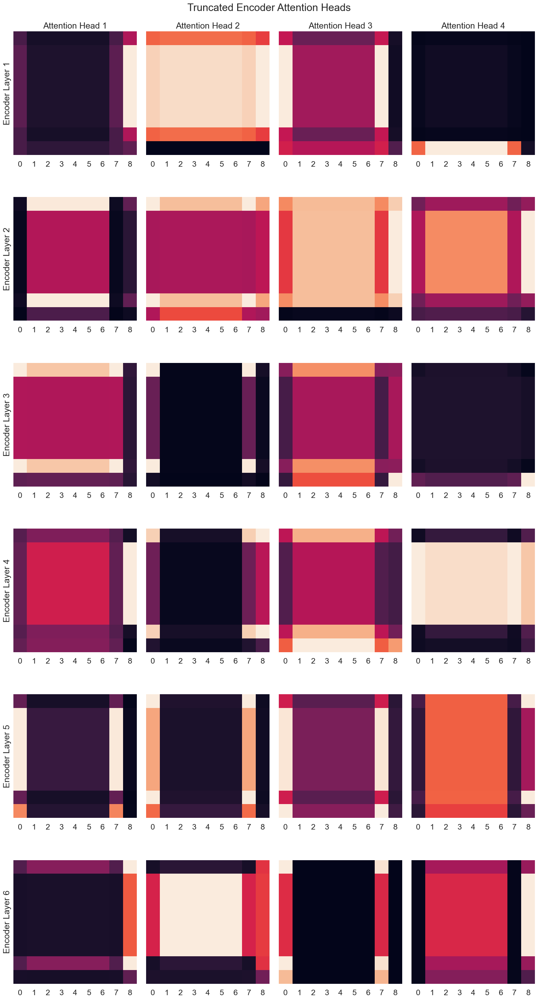

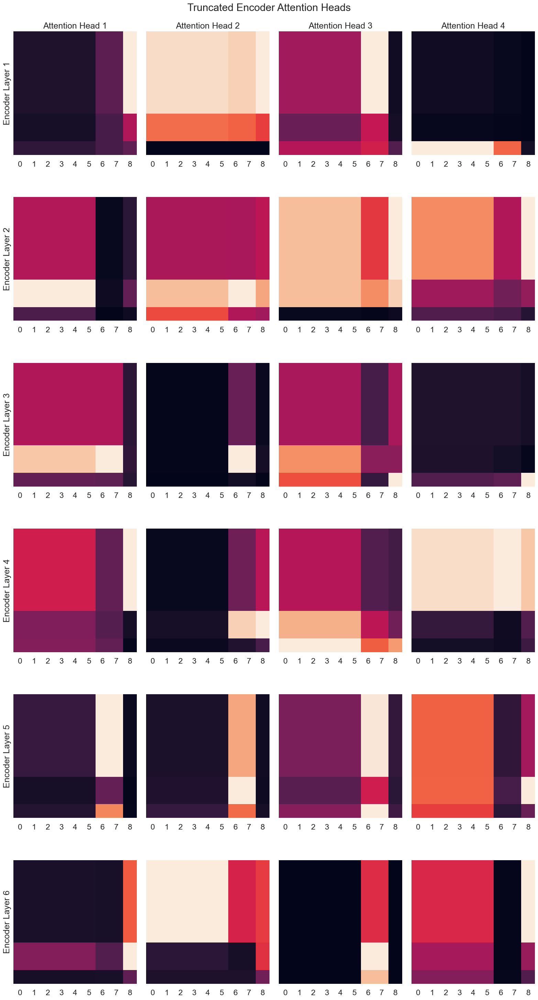

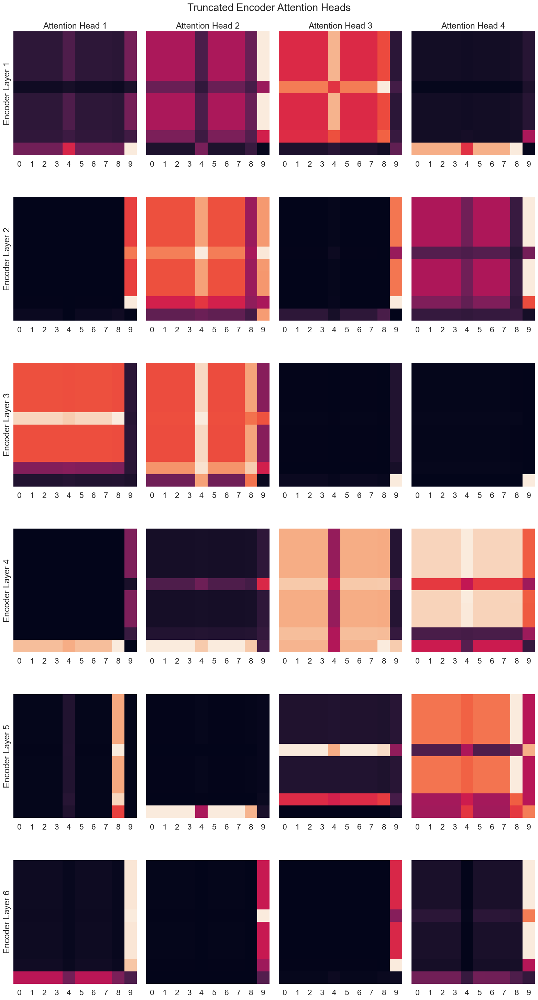

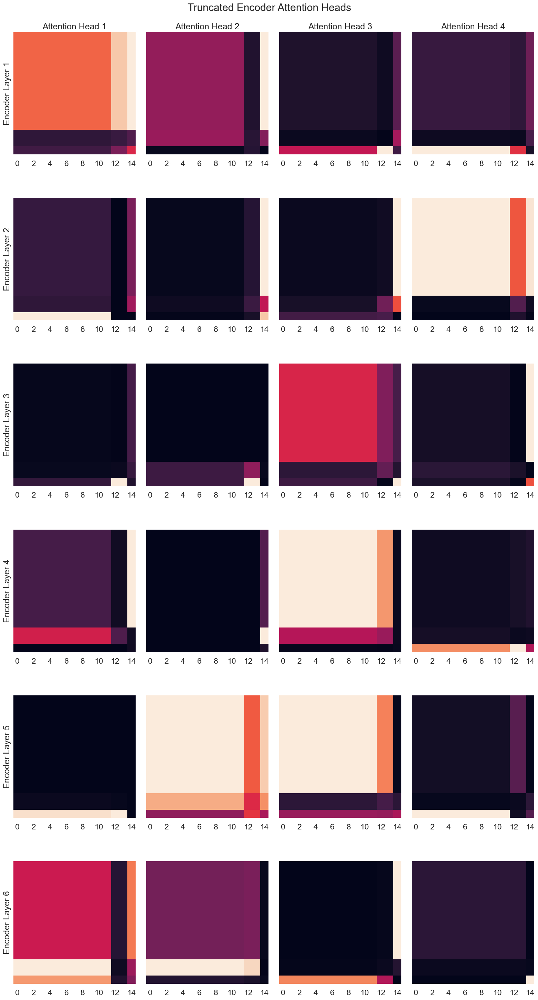

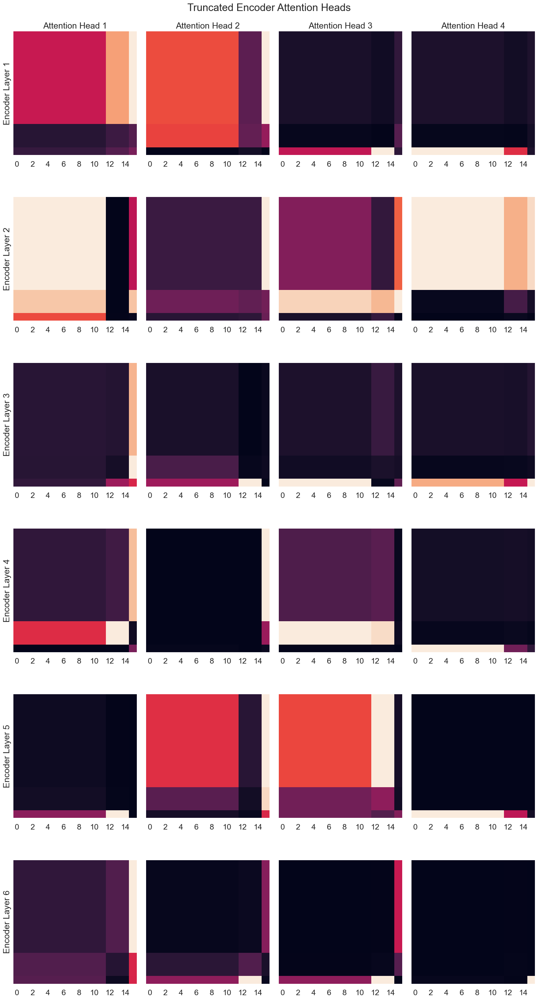

...

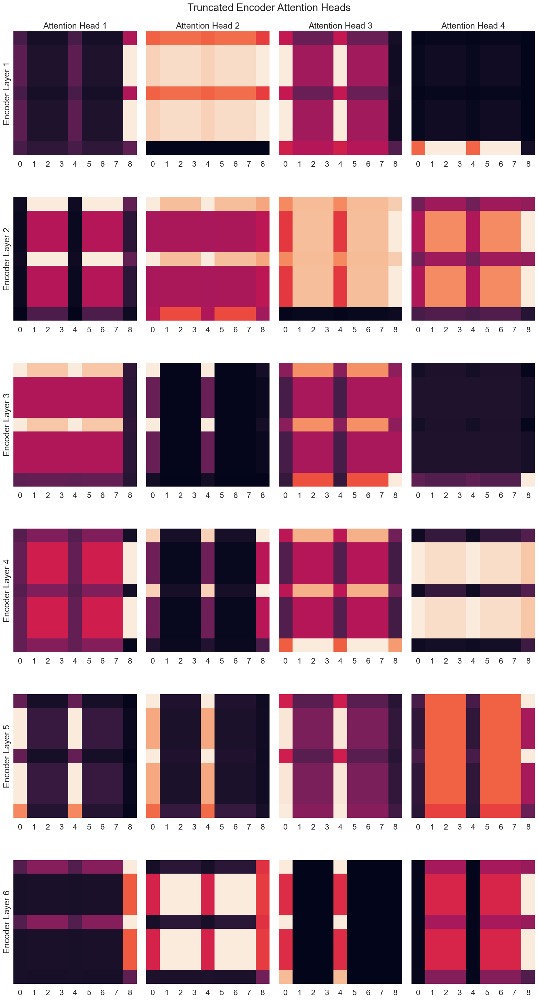

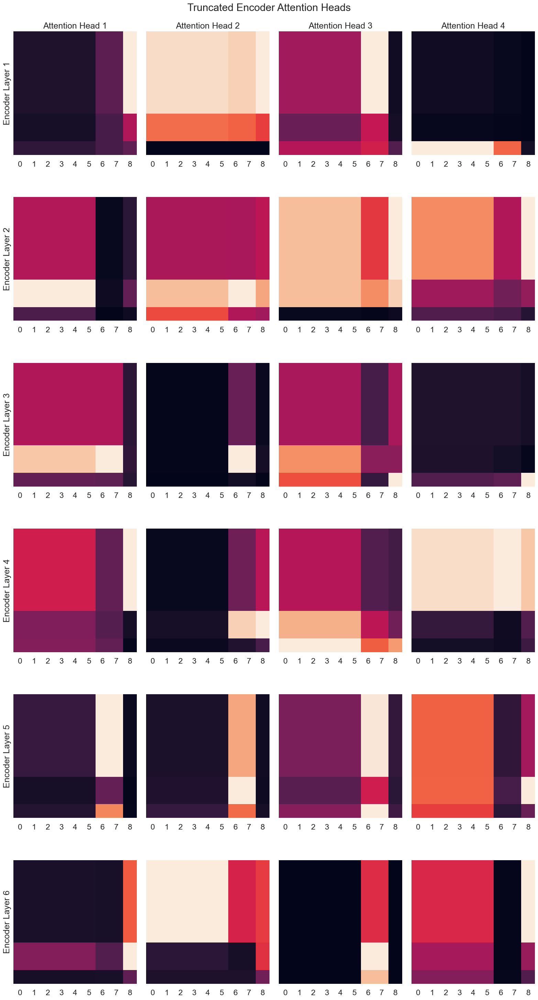

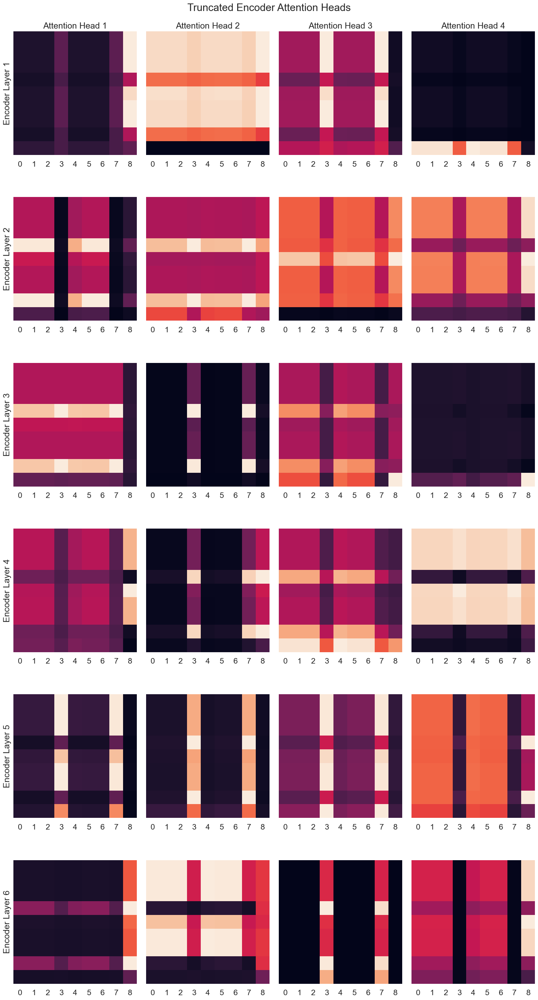

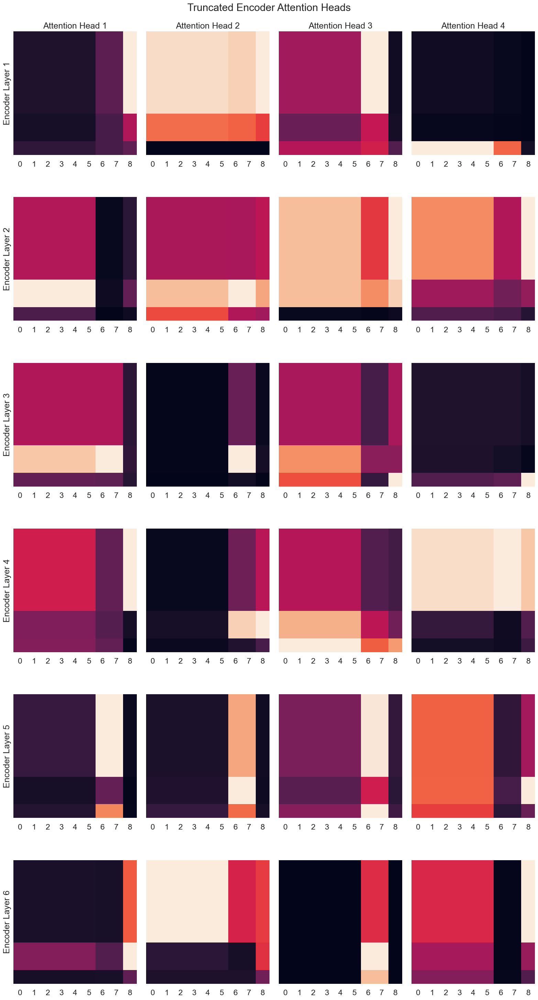

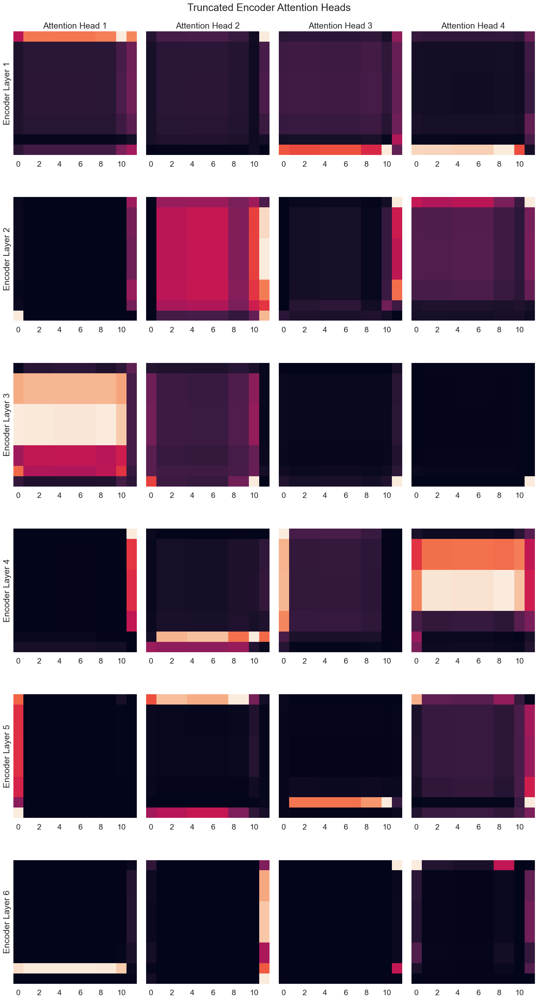

In [69]:
for example_index in np.where(confidently_correct_index)[0]:
    
    n_inputs = np.argmax(np.all(X_val[0][example_index].round(2) == 0, axis=1))
    
    
    num_layers = 6
    num_heads = 4
    
    fig, ax = plt.subplots(num_layers, num_heads, figsize=(16, num_layers*5))
    
    for encoder_layer in range(num_layers):
        
        encoder_layer_name = f"transformer_encoder_{encoder_layer}" if encoder_layer else f"transformer_encoder"
        attention = get_attention_scores(model, model_inputs=X_val, layer_name=encoder_layer_name)
        
        for head in range(num_heads):
            attention_matrix = attention[example_index, head, :n_inputs, :n_inputs]
            sns.heatmap(
                attention_matrix.T,
                square=True,
                cbar=False,
                vmin=0,
                #vmax=0.1,
                ax=ax[encoder_layer, head],
                yticklabels=[]
            );
    
            
        
        ax[encoder_layer, 0].set(
            ylabel=f"Encoder Layer {encoder_layer+1}"
        )
    for head in range(num_heads):
        ax[0, head].set(
            title=f"Attention Head {head+1}"
        )
    
    fig.suptitle("Truncated Encoder Attention Heads")
    
    plt.tight_layout()
    path = os.path.join(cwd, "plots", "2024-02-17-Data-Examples", "certain_cases", f"Truck-{example_index}-Attention_Matrix.pdf")
    plt.savefig(path)
